<a href="https://colab.research.google.com/github/cheyoung211/2023-Auttum-Maths-for-ML/blob/main/HuggingFace_PretrainedCLIP_Transformers_27_36.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

"Joshua K. Cage 저자 임선집 옮긴이의 101가지 문제로 배우는 딥러닝 허깅페이스 트랜스포머 with 파이토치(Python Transformers By Huggingface Hands On:)의 예제를 실행한 것임을 알립니다.    This code has been brought from the GitHub repository below and has been slightly modified.:

https://github.com/jasonyim2/book3/blob/main/Transformers%2027-36.ipynb "

In [71]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 27

In [72]:
##새주석: transformers 와 ftfy(fices text for you) installing
!pip install transformers
!pip install ftfy

# 28

In [73]:
import os
import glob
import cv2
import matplotlib.pyplot as plt
import torch
from google.colab.patches import cv2_imshow

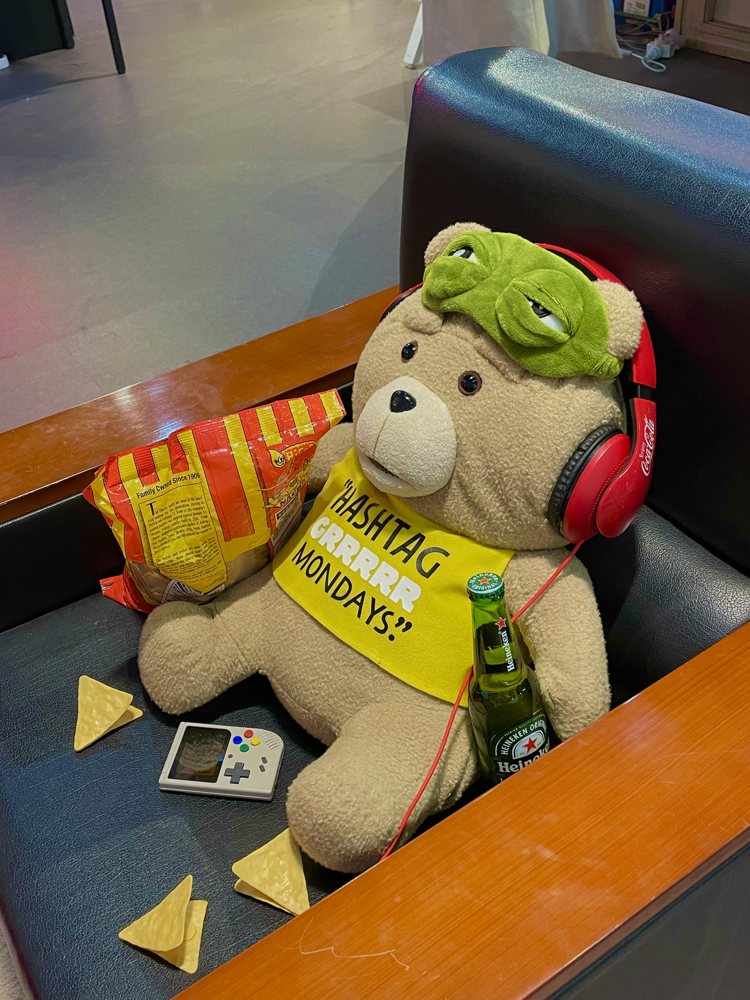

In [74]:
image_path = '/content/drive/MyDrive/Colab Notebooks/bear.jpg'
image = cv2.imread(image_path)
cv2_imshow(image)

# 29

In [75]:
# 모델 및 프로세서 불러오기
from transformers import CLIPProcessor, CLIPModel

model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")


# 30

In [76]:
model
##새주석: 모델 설명
##새주석: text용 - text embedding + positional embedding & attention & layer normalization
##새주석: image용 - patch ebedding + positional embedding & self-attention & layer normlaization

CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1e-05,

# 31

In [77]:
# 텍스트를 리스트 타입으로 입력
##새주석 : 가능할만한 답안을 후보 리스트로 지정
candidates = ["a teaddy bear lying on the couch", "a photo of bears", "a photo of a dog", "a lion", "a frog reading a book"]

# 프로세서(CLIPPprocessor)에 텍스트 및 이미지를 입력하여 인코딩
inputs = processor(text=candidates, images=image, return_tensors="pt", padding=True)

# inputs 출력
inputs

{'input_ids': tensor([[49406,   320,   600, 24746,  4298,  7175,   525,   518, 12724, 49407],
        [49406,   320,  1125,   539,  6182, 49407, 49407, 49407, 49407, 49407],
        [49406,   320,  1125,   539,   320,  1929, 49407, 49407, 49407, 49407],
        [49406,   320,  5567, 49407, 49407, 49407, 49407, 49407, 49407, 49407],
        [49406,   320, 11438,  2337,   320,  1116, 49407, 49407, 49407, 49407]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
        [1, 1, 1, 1, 1, 1, 0, 0, 0, 0],
        [1, 1, 1, 1, 1, 1, 1, 0, 0, 0],
        [1, 1, 1, 1, 0, 0, 0, 0, 0, 0],
        [1, 1, 1, 1, 1, 1, 1, 0, 0, 0]]), 'pixel_values': tensor([[[[-0.3908, -0.3762, -0.3908,  ...,  0.6311,  0.6457,  0.6457],
          [-0.3762, -0.3616, -0.4054,  ...,  0.6749,  0.6019,  0.6457],
          [-0.3908, -0.3908, -0.4054,  ...,  0.6603,  0.6603,  0.6311],
          ...,
          [-0.8580, -0.8580, -0.8872,  ..., -0.9310, -0.9164, -0.9164],
          [-0.9164, -0.8434, -0.8434,  ..., -

#32

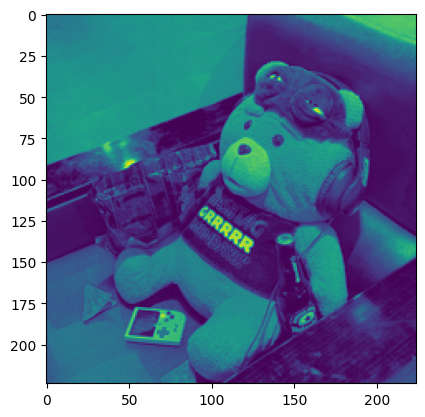

In [78]:
# 인코딩한 이미지 출력
##새주석 : 3channel 중 첫 번째 channel
plt.imshow(inputs['pixel_values'][0][0]);

In [79]:
# inputs['pixel_values'] 차원 확인
inputs['pixel_values'].shape

torch.Size([1, 3, 224, 224])

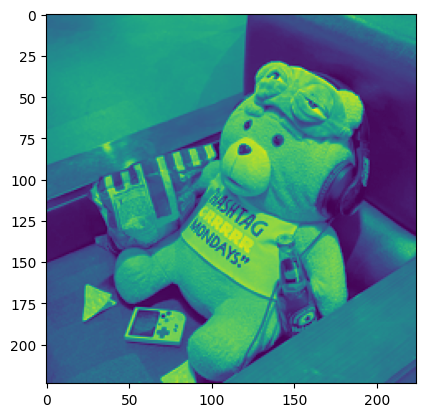

In [80]:
# 인코딩한 이미지 출력. 인덱스를 [0][1]로 변경
##새주석 : 3 channel 중 2번째 channel
plt.imshow(inputs['pixel_values'][0][1]);

# 33

In [81]:
# 인코딩된 텍스트 출력
##새주석 : 각 후보마다 인코딩 결과
inputs['input_ids']

tensor([[49406,   320,   600, 24746,  4298,  7175,   525,   518, 12724, 49407],
        [49406,   320,  1125,   539,  6182, 49407, 49407, 49407, 49407, 49407],
        [49406,   320,  1125,   539,   320,  1929, 49407, 49407, 49407, 49407],
        [49406,   320,  5567, 49407, 49407, 49407, 49407, 49407, 49407, 49407],
        [49406,   320, 11438,  2337,   320,  1116, 49407, 49407, 49407, 49407]])

In [82]:
# 위의 결과를 디코딩한 텍스트 출력
##새주석 : 0번째 후보의 디코딩 결
processor.tokenizer.decode(inputs['input_ids'][0])

'<|startoftext|>a teaddy bear lying on the couch <|endoftext|>'

# 34

In [83]:
# 모델을 eval 모드로 전환
##새주석 : 모델이 평가 모드로 전환되면, 드롭아웃이 비활성화되고 배치 정규화의 이동 평균과 이동 분산이 업데이트되지 않음
model.eval()

# **inputs에서의 ** 표시는 inputs 변수가 키(key)와 값(value)로 이루어져 있을 때
# input 변수에 담긴 키와 값을 모두 모델에 입력하는 용도임
outputs = model(**inputs)

# 출력물 outputs의 키(key) 출력
outputs.keys()


odict_keys(['logits_per_image', 'logits_per_text', 'text_embeds', 'image_embeds', 'text_model_output', 'vision_model_output'])

# 35

In [84]:
##새주석 : logits_per_image - 이미지와 텍스트의 유사도
logits_per_image = outputs.logits_per_image
print(logits_per_image)

tensor([[25.9174, 23.1657, 18.5728, 18.2622, 21.7393]], grad_fn=<TBackward0>)


# 36

In [85]:
# logits_per_image에 담긴 값을 입력값 행별로(dim=1) 소프트맥스 함수에 투입
probs = logits_per_image.softmax(dim=1)

# 변수 probs에 담긴 값 중에 최고값의 인덱스를 argmax로 찾고
# item()을 통해 레이블 즉 제목을 출력
# 그 결과가 cadidates의 인덱스 값이 됨
## 새주석 : 가장 값이 높다 -> 가장 유사도가 높다 -> 가장 알맞은 후보
print(candidates[torch.argmax(probs).item()])

a teaddy bear lying on the couch
